# Prediction of Taxi Trip durations in NYC

### Eleftherios Kokkinis

In [1]:
#Data manipulation and analysis
import pandas as pd
import numpy as np
from pandas.tseries.holiday import USFederalHolidayCalendar
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
import xgboost as xgb
from sklearn.metrics import mean_squared_error

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import datashader as ds
import datashader.transfer_functions as tf
import holoviews as hv
from holoviews.element.tiles import StamenTerrain

#geographical processing
import geopandas as gpd
from shapely.geometry import Point, LineString
from shapely import wkt
from geopy.distance import geodesic, great_circle
from geopandas.tools import sjoin

#machine learning and optimization
import optuna
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

#parallel processing
from concurrent.futures import ThreadPoolExecutor, as_completed

#others
import warnings
import googlemaps
import ast
from ast import literal_eval
from tqdm import tqdm
from datetime import datetime

data = pd.read_csv('train.csv')

#### Uitilizing Google's Distance Matrix and Directions APIs

I will start by creating temporal features and using google maps API to calculate the optimal taxi route from a pickup point to a dropoff point. The API takes into consideration NYC's street network as well as historical traffic conditions.

In [2]:

taxi_data = data

taxi_data['pickup_datetime'] = pd.to_datetime(taxi_data['pickup_datetime'])
taxi_data['month'] = taxi_data['pickup_datetime'].dt.month
# taxi_data['week'] = taxi_data['pickup_datetime'].dt.week  
taxi_data['day'] = taxi_data['pickup_datetime'].dt.day
taxi_data['hour'] = taxi_data['pickup_datetime'].dt.hour
taxi_data['minute'] = taxi_data['pickup_datetime'].dt.minute


taxi_data = taxi_data.sort_values('pickup_datetime')

def batch_data(data, batch_size):
    for i in range(0, len(data), batch_size):
        yield data.iloc[i:i + batch_size]

batch_size = 10

batches = batch_data(taxi_data, batch_size)

In [3]:
total_batches_count = 0

for _ in batches:
    total_batches_count += 1

print(f"Total number of batches: {total_batches_count}")

Total number of batches: 145865


In [9]:
from collections import Counter


batch_sizes = Counter()


for batch in batches:
    batch_size = len(batch)
    batch_sizes[batch_size] += 1


for size, count in batch_sizes.items():
    print(f"Batch size {size}: {count} batches")


Batch size 10: 145864 batches
Batch size 4: 1 batches


In [2]:
API_KEY ='my_key'

In [ ]:
gmaps_client = googlemaps.Client(key=API_KEY)
taxi_data['calculated_distance'] = None
taxi_data['calculated_duration'] = None
taxi_data['pickup_address'] = None
taxi_data['pickup_postalcode'] = None
taxi_data['dropoff_address'] = None
taxi_data['dropoff_postalcode'] = None


def process_batch(batch, gmaps_client):
    origins = batch.apply(lambda row: (row['pickup_latitude'], row['pickup_longitude']), axis=1).tolist()
    destinations = batch.apply(lambda row: (row['dropoff_latitude'], row['dropoff_longitude']), axis=1).tolist()


    departure_times = batch['pickup_datetime'].apply(
        lambda x: datetime(2028, x.month, x.day, x.hour, x.minute, x.second).timestamp()).tolist()
    mean_departure_time = sum(departure_times) / len(departure_times)


    try:

        result = gmaps_client.distance_matrix(origins=origins,
                                              destinations=destinations,
                                              mode="driving",
                                              departure_time=mean_departure_time,
                                              traffic_model='best_guess')


        for i in range(len(batch)):
            distance = result['rows'][i]['elements'][i]['distance']['value']
            duration_in_traffic = result['rows'][i]['elements'][i].get('duration_in_traffic', {}).get('value')


            batch.at[batch.index[i], 'calculated_distance'] = distance
            batch.at[batch.index[i], 'calculated_duration'] = duration_in_traffic


    except Exception as e:
        print(f"Error processing batch: {e}")

    return batch

taxi_data = taxi_data.sort_values('pickup_datetime')

processed_batches = []
batch_count = 0


total_records = len(taxi_data)
batch_size = 10
total_batches = (total_records + batch_size - 1) // batch_size

for batch in batches:
    processed_batch = process_batch(batch, gmaps_client)
    processed_batches.append(processed_batch)

    batch_count += 1
    batches_left = total_batches - batch_count
    print(f"Processed batch number {batch_count}, {batches_left} batches left")

processed_df = pd.concat(processed_batches)

taxi_data = taxi_data.merge(processed_df, left_index=True, right_index=True,
                            suffixes=('', '_updated'))


update_cols = ['calculated_distance', 'calculated_duration'
               ]
for col in update_cols:
    taxi_data[col] = taxi_data[col + '_updated']


for col in taxi_data.columns:
    if col.endswith('_updated'):
        taxi_data.drop(col, axis=1, inplace=True)

taxi_data.to_csv("updated_taxi_data.csv", index=False)


print(taxi_data.head())



In [5]:
taxi_data

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,month,day,hour,minute,calculated_distance,calculated_duration,pickup_address,pickup_postalcode,dropoff_address,dropoff_postalcode
96469,id0190469,2,2016-01-01 00:00:17,2016-01-01 00:14:26,5,-73.981743,40.719158,-73.938828,40.829182,N,...,1,1,0,0,15294,1471,None,None,None,None
223872,id1665586,1,2016-01-01 00:00:53,2016-01-01 00:22:27,1,-73.985085,40.747166,-73.958038,40.717491,N,...,1,1,0,0,9983,1433,None,None,None,None
713067,id1210365,2,2016-01-01 00:01:01,2016-01-01 00:07:49,5,-73.965279,40.801041,-73.947479,40.815170,N,...,1,1,0,1,2750,567,None,None,None,None
652463,id3888279,1,2016-01-01 00:01:14,2016-01-01 00:05:54,1,-73.982292,40.751331,-73.991341,40.750340,N,...,1,1,0,1,1051,397,None,None,None,None
722901,id0924227,1,2016-01-01 00:01:20,2016-01-01 00:13:36,1,-73.970108,40.759800,-73.989357,40.742989,N,...,1,1,0,1,2935,842,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853710,id1255468,2,2016-06-30 23:58:52,2016-07-01 00:06:44,1,-73.982750,40.745289,-73.969002,40.757950,N,...,6,30,23,58,2286,599,None,None,None,None
419031,id2013516,1,2016-06-30 23:59:09,2016-07-01 00:11:43,2,-73.955109,40.689564,-73.978203,40.685802,N,...,6,30,23,59,2732,654,None,None,None,None
1008720,id0376262,1,2016-06-30 23:59:10,2016-07-01 00:41:36,2,-73.873093,40.774097,-73.926704,40.856739,N,...,6,30,23,59,16763,2001,None,None,None,None
405743,id2332349,2,2016-06-30 23:59:37,2016-07-01 00:23:39,5,-73.998291,40.722618,-73.971779,40.762470,N,...,6,30,23,59,5328,1293,None,None,None,None


In [12]:
taxi_data.drop(["pickup_address", "pickup_postalcode", "dropoff_postalcode",
                                    "dropoff_address"], axis=1, inplace = True)

In [13]:
taxi_data.dropna(subset=['calculated_duration'], inplace=True)

In [14]:
taxi_data.isna().sum()

id                     0
vendor_id              0
pickup_datetime        0
dropoff_datetime       0
passenger_count        0
pickup_longitude       0
pickup_latitude        0
dropoff_longitude      0
dropoff_latitude       0
store_and_fwd_flag     0
trip_duration          0
month                  0
day                    0
hour                   0
minute                 0
calculated_distance    0
calculated_duration    0
dtype: int64

In [16]:
taxi_data.to_csv("updated_taxi_data_NoNaNs.csv", index=False)

In [17]:
taxi_data.sort_index(inplace=True)
taxi_data

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,month,day,hour,minute,calculated_distance,calculated_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,3,14,17,24,2006,555
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,6,12,0,43,2515,610
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,1,19,11,35,9739,1105
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,4,6,19,32,1820,632
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,3,26,13,30,1604,293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,778,4,8,13,31,2232,438
1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,655,1,10,7,35,7640,868
1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,764,4,22,6,57,10176,744
1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,373,1,5,15,56,1233,577


Creating a new feature to display the day of the week for each observation, as well as another variable where only the date of the pickup_datetime is stored.

In [19]:
taxi_data['day_of_week'] = taxi_data['pickup_datetime'].dt.day_name()


In [22]:
taxi_data['date'] = taxi_data['pickup_datetime'].dt.date

taxi_data['date'] = pd.to_datetime(taxi_data['date'])



In [23]:
taxi_data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,month,day,hour,minute,calculated_distance,calculated_duration,day_of_week,date
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,3,14,17,24,2006,555,Monday,2016-03-14
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,6,12,0,43,2515,610,Sunday,2016-06-12
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,1,19,11,35,9739,1105,Tuesday,2016-01-19
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,4,6,19,32,1820,632,Wednesday,2016-04-06
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,3,26,13,30,1604,293,Saturday,2016-03-26


#### Weather Data - Holidays - Merging

Merging the taxi data with the weather data:

In [21]:
weather = pd.read_csv('weather_data.csv')
weather

,date,average temperature,precipitation,snow fall,snow depth
0,2016-01-01,38.0,0.00,0.0,0
1,2016-01-02,36.0,0.00,0.0,0
2,2016-01-03,40.0,0.00,0.0,0
3,2016-01-04,25.0,0.00,0.0,0
4,2016-01-05,20.0,0.00,0.0,0
...,...,...,...,...,...
361,2016-12-27,50.0,0.00,0.0,0
362,2016-12-28,37.0,0.00,0.0,0
363,2016-12-29,39.5,0.39,0.0,0
364,2016-12-30,36.5,0.01,0.0,0


In [25]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date                 366 non-null    object 
 1   average temperature  366 non-null    float64
 2   precipitation        366 non-null    float64
 3   snow fall            366 non-null    float64
 4   snow depth           366 non-null    int64  
dtypes: float64(3), int64(1), object(1)
memory usage: 14.4+ KB


In [26]:
weather['date'] = pd.to_datetime(weather['date'])

In [27]:

merged_dataset = taxi_data.merge(weather, on='date', how='left')

In [28]:
merged_dataset.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,hour,minute,calculated_distance,calculated_duration,day_of_week,date,average temperature,precipitation,snow fall,snow depth
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,17,24,2006,555,Monday,2016-03-14,45.5,0.29,0.0,0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,0,43,2515,610,Sunday,2016-06-12,72.5,0.00,0.0,0
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,11,35,9739,1105,Tuesday,2016-01-19,22.0,0.00,0.0,0
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,19,32,1820,632,Wednesday,2016-04-06,39.0,0.00,0.0,0
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,13,30,1604,293,Saturday,2016-03-26,46.5,0.00,0.0,0


Creating a new feature that indicates which days are public holidays. Intuition tells us that public holidays may have an effect on taxi trip durations. I include weekends as holidays as well.

In [30]:

calendar = USFederalHolidayCalendar()


start_date = merged_dataset['date'].min()
end_date = merged_dataset['date'].max()
holidays = calendar.holidays(start=start_date, end=end_date)

merged_dataset['date'] = pd.to_datetime(merged_dataset['date'])
merged_dataset['is_holiday'] = merged_dataset['date'].isin(holidays).astype(int)



In [32]:
merged_dataset['is_holiday'] = merged_dataset.apply(lambda row: 1 if (row['is_holiday'] == 1 or row['day_of_week'] in ['Saturday', 'Sunday']) else 0, axis=1)

In [34]:
final_data_weekend = merged_dataset[merged_dataset['day_of_week'].isin(['Saturday', 'Sunday'])]

final_data_weekend_holidays = final_data_weekend[final_data_weekend['is_holiday'] == 1]


number_of_rows = final_data_weekend_holidays.shape[0]

print(f"The number of rows where the day is Sunday or Saturday and are marked with 1 in the 'holidays' column is: {number_of_rows}")

The number of rows where the day is Sunday or Saturday and are marked with 1 in the 'holidays' column is: 416181


In [43]:
merged_dataset[merged_dataset['is_holiday']== 1].shape

(443428, 24)

In [44]:
merged_dataset.to_csv('new_merged_dataset.csv', index = False)

In [6]:
import pandas as pd
taxi_data = pd.read_csv('new_merged_dataset.csv')

In [2]:
taxi_data = taxi_data.sort_values('pickup_datetime')

In [ ]:
import googlemaps
from datetime import datetime
import pandas as pd
from concurrent.futures import ThreadPoolExecutor, as_completed


gmaps_client = googlemaps.Client(key=API_KEY)


taxi_data['route_polyline'] = None
taxi_data['pickup_datetime'] = pd.to_datetime(taxi_data['pickup_datetime'])


def process_row(row, gmaps_client):
    origin = (row['pickup_latitude'], row['pickup_longitude'])
    destination = (row['dropoff_latitude'], row['dropoff_longitude'])
    departure_time = datetime(2028, row['pickup_datetime'].month, row['pickup_datetime'].day,
                              row['pickup_datetime'].hour, row['pickup_datetime'].minute,
                              row['pickup_datetime'].second).timestamp()

    try:

        directions_result = gmaps_client.directions(origin, destination,
                                                    mode="driving",
                                                    departure_time=departure_time)


        if directions_result:
            polyline = directions_result[0]['overview_polyline']['points']
            return polyline
    except Exception as e:
        print(f"Error processing row: {e}")
        return None


def parallel_process(taxi_data, gmaps_client, max_workers=10):
    total_rows = len(taxi_data)
    processed_count = 0

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        future_to_row = {executor.submit(process_row, row, gmaps_client): i for i, row in taxi_data.iterrows()}
        for future in as_completed(future_to_row):
            row_index = future_to_row[future]
            try:
                polyline = future.result()
                taxi_data.at[row_index, 'route_polyline'] = polyline
            except Exception as e:
                print(f"Error processing row {row_index}: {e}")


            processed_count += 1
            print(f"Processed {processed_count}/{total_rows} rows...")

    return taxi_data

taxi_data = parallel_process(taxi_data, gmaps_client, max_workers=10)

taxi_data.to_csv("updated_taxi_data_routes.csv", index=False)
print(taxi_data.head())


I used the directions API to get all the polyline data for the taxi routes. I then decoded the polyline data into the route coordinates.

In [8]:
taxi_data = pd.read_csv('updated_taxi_data_routes.csv')

In [9]:
taxi_data

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,calculated_distance,calculated_duration,day_of_week,date,average temperature,precipitation,snow fall,snow depth,is_holiday,route_polyline
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,2006,555,Monday,2016-03-14,45.5,0.29,0.0,0,0,ymywFftpbMHOFSDq@C]QWSSOISEQ@YPKN[CUKq@]eCaB}F...
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,2515,610,Sunday,2016-06-12,72.5,0.00,0.0,0,1,_wswFxhpbMtd@dZjCdB`@TiE|McDbK}@zC{@jCgDpKkApD...
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,9739,1105,Tuesday,2016-01-19,22.0,0.00,0.0,0,0,}vxwF|~obM|EqOjB{FJa@rBoGtAiEh@_B`EmMDWnBkGn@k...
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,1820,632,Wednesday,2016-04-06,39.0,0.00,0.0,0,0,{bpwFlbvbMtJ`A~B^dHjAnARPg@Pi@zAmEbB{E`C{Gd@oA...
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,1604,293,Saturday,2016-03-26,46.5,0.00,0.0,0,1,ml~wFhznbMtPxKpCfBjCmIbFyOjD~B`FdD|BvA~CxB`DrB...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458497,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,...,2232,438,Friday,2016-04-08,45.0,0.01,0.0,0,0,}buwFvtpbMe@[tAoE`@mAHY|BxAtFnD|B~AfEpCrA|@rA|...
1458498,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,...,7640,868,Sunday,2016-01-10,49.5,1.80,0.0,0,1,umuwF|gtbMnAv@lAz@uDrLcHbTqBoAMBOd@aBjF[|@?NS?...
1458499,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,...,10176,744,Friday,2016-04-22,70.5,0.00,0.0,0,0,quywFnblbMhDwKxEcOp@sBiCaBpAaE\cAr@uBD[F[JILCn...
1458500,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,...,1233,577,Tuesday,2016-01-05,20.0,0.00,0.0,0,0,qxuwFvrpbM{ByAqCkBcFcDaEoCuB}AoC_BqAw@eFiDkFoD...


In [10]:

import polyline

def decode_polyline(encoded_polyline):
    try:

        return polyline.decode(encoded_polyline)
    except Exception as e:
        return None 


taxi_data['decoded_polyline'] = taxi_data['route_polyline'].apply(lambda x: decode_polyline(x) if pd.notnull(x) else None)

taxi_data.head()


,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,calculated_duration,day_of_week,date,average temperature,precipitation,snow fall,snow depth,is_holiday,route_polyline,decoded_polyline
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,555,Monday,2016-03-14,45.5,0.29,0.0,0,0,ymywFftpbMHOFSDq@C]QWSSOISEQ@YPKN[CUKq@]eCaB}F...,"[(40.76781, -73.98228), (40.76776, -73.9822), ..."
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,610,Sunday,2016-06-12,72.5,0.00,0.0,0,1,_wswFxhpbMtd@dZjCdB`@TiE|McDbK}@zC{@jCgDpKkApD...,"[(40.73856, -73.98045), (40.73253, -73.9848), ..."
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,1105,Tuesday,2016-01-19,22.0,0.00,0.0,0,0,}vxwF|~obM|EqOjB{FJa@rBoGtAiEh@_B`EmMDWnBkGn@k...,"[(40.76415, -73.97887), (40.76304, -73.97622),..."
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,632,Wednesday,2016-04-06,39.0,0.00,0.0,0,0,{bpwFlbvbMtJ`A~B^dHjAnARPg@Pi@zAmEbB{E`C{Gd@oA...,"[(40.71998, -74.01015), (40.71811, -74.01048),..."
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,293,Saturday,2016-03-26,46.5,0.00,0.0,0,1,ml~wFhznbMtPxKpCfBjCmIbFyOjD~B`FdD|BvA~CxB`DrB...,"[(40.79319, -73.97301), (40.79036, -73.97506),..."


In [11]:
taxi_data.drop(columns= 'route_polyline', inplace = True)

In [12]:
taxi_data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,calculated_distance,calculated_duration,day_of_week,date,average temperature,precipitation,snow fall,snow depth,is_holiday,decoded_polyline
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,2006,555,Monday,2016-03-14,45.5,0.29,0.0,0,0,"[(40.76781, -73.98228), (40.76776, -73.9822), ..."
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,2515,610,Sunday,2016-06-12,72.5,0.00,0.0,0,1,"[(40.73856, -73.98045), (40.73253, -73.9848), ..."
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,9739,1105,Tuesday,2016-01-19,22.0,0.00,0.0,0,0,"[(40.76415, -73.97887), (40.76304, -73.97622),..."
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,1820,632,Wednesday,2016-04-06,39.0,0.00,0.0,0,0,"[(40.71998, -74.01015), (40.71811, -74.01048),..."
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,1604,293,Saturday,2016-03-26,46.5,0.00,0.0,0,1,"[(40.79319, -73.97301), (40.79036, -73.97506),..."


In [13]:
taxi_data.to_csv('updated_taxi_data_routes_decoded_polylines.csv', index = False)

Checking the available period:

In [9]:
taxi_data['date'].min(), taxi_data['date'].max()

('2016-01-01', '2016-06-30')

### Traffic Data - Preprocessing

In [5]:
traffic_data = pd.read_csv('Automated_Traffic_Volume_Counts_20231230.csv')

traffic_data

Recreating the date from the current features:

In [14]:
traffic_data['date'] = pd.to_datetime(traffic_data[['Yr','M','D']].astype(str).agg('-'.join, axis=1), format='%Y-%m-%d')

In [16]:
traffic_data

,RequestID,Boro,Yr,M,D,HH,MM,Vol,SegmentID,WktGeom,street,fromSt,toSt,Direction,date
0,1100,Staten Island,2011,10,14,10,45,102,103882,POINT (963246 173171.4),BAY ST,RICHMOND TERR,STUYVESANT PL,SB,2011-10-14
1,1100,Staten Island,2011,10,14,11,0,110,103882,POINT (963246 173171.4),BAY ST,RICHMOND TERR,STUYVESANT PL,SB,2011-10-14
2,1100,Staten Island,2011,10,14,11,15,101,103882,POINT (963246 173171.4),BAY ST,RICHMOND TERR,STUYVESANT PL,SB,2011-10-14
3,1100,Staten Island,2011,10,14,11,30,112,103882,POINT (963246 173171.4),BAY ST,RICHMOND TERR,STUYVESANT PL,SB,2011-10-14
4,1100,Staten Island,2011,10,14,11,45,94,103882,POINT (963246 173171.4),BAY ST,RICHMOND TERR,STUYVESANT PL,SB,2011-10-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27414476,31054,Queens,2019,10,20,22,45,5,49507,POINT (1018436.0690197587 196329.9638902961),73 PLACE,Central Avenue,Dead end,SB,2019-10-20
27414477,31054,Queens,2019,10,20,23,0,7,49507,POINT (1018436.0690197587 196329.9638902961),73 PLACE,Central Avenue,Dead end,SB,2019-10-20
27414478,31054,Queens,2019,10,20,23,15,4,49507,POINT (1018436.0690197587 196329.9638902961),73 PLACE,Central Avenue,Dead end,SB,2019-10-20
27414479,31054,Queens,2019,10,20,23,30,5,49507,POINT (1018436.0690197587 196329.9638902961),73 PLACE,Central Avenue,Dead end,SB,2019-10-20


In [15]:
traffic_data['date'].min(), traffic_data['date'].max()

(Timestamp('2000-01-01 00:00:00'), Timestamp('2022-10-27 00:00:00'))

Filtering the traffic data to keep only the time period where our taxi data are available

In [18]:
mask = (traffic_data['date'] >= '2016-01-01') & (traffic_data['date'] <= '2016-06-30')
filtered_traffic_data = traffic_data.loc[mask]
filtered_traffic_data

,RequestID,Boro,Yr,M,D,HH,MM,Vol,SegmentID,WktGeom,street,fromSt,toSt,Direction,date
15759985,22409,Brooklyn,2016,1,4,0,0,82,158347,POINT (1006358.7948597018 183125.52457974554),EASTERN PARKWAY,Lincoln Place,Howard Avenue,EB,2016-01-04
15759986,22409,Brooklyn,2016,1,4,0,15,78,158347,POINT (1006358.7948597018 183125.52457974554),EASTERN PARKWAY,Lincoln Place,Howard Avenue,EB,2016-01-04
15759987,22409,Brooklyn,2016,1,4,0,30,70,158347,POINT (1006358.7948597018 183125.52457974554),EASTERN PARKWAY,Lincoln Place,Howard Avenue,EB,2016-01-04
15759988,22409,Brooklyn,2016,1,4,0,45,69,158347,POINT (1006358.7948597018 183125.52457974554),EASTERN PARKWAY,Lincoln Place,Howard Avenue,EB,2016-01-04
15759989,22409,Brooklyn,2016,1,4,1,0,56,158347,POINT (1006358.7948597018 183125.52457974554),EASTERN PARKWAY,Lincoln Place,Howard Avenue,EB,2016-01-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26844827,22611,Brooklyn,2016,4,15,9,0,68,50963,POINT (1022733.3567963842 184976.57608910862),SUTTER AVENUE,South Conduit Avenue,Dead end,EB,2016-04-15
26844828,22611,Brooklyn,2016,4,15,9,15,62,50963,POINT (1022733.3567963842 184976.57608910862),SUTTER AVENUE,South Conduit Avenue,Dead end,EB,2016-04-15
26844829,22611,Brooklyn,2016,4,15,9,30,54,50963,POINT (1022733.3567963842 184976.57608910862),SUTTER AVENUE,South Conduit Avenue,Dead end,EB,2016-04-15
26844830,22611,Brooklyn,2016,4,15,9,45,71,50963,POINT (1022733.3567963842 184976.57608910862),SUTTER AVENUE,South Conduit Avenue,Dead end,EB,2016-04-15


In [20]:
filtered_traffic_data['Direction'].value_counts()

SB    429751
EB    429595
NB    428653
WB    406215
Name: Direction, dtype: int64

In [21]:
filtered_traffic_data['Boro'].value_counts()

Brooklyn         493250
Queens           478323
Bronx            363375
Manhattan        201566
Staten Island    157700
Name: Boro, dtype: int64

In [31]:
filtered_traffic_data['date'].value_counts()

2016-06-13    36219
2016-06-14    31200
2016-06-16    30336
2016-06-15    29609
2016-06-17    27595
              ...  
2016-02-18      480
2016-02-17      480
2016-02-16      480
2016-02-15      384
2016-02-19      321
Name: date, Length: 172, dtype: int64

In [23]:
filtered_traffic_data.to_csv('Automated_Traffic_Volume_Counts_20231230_filtered.csv', index = False)

I will now geocode the street addresses from the Traffic Data. This is needed to map the traffic data back to the taxi route coordinates.

In [1]:

traffic_data = pd.read_csv('Automated_Traffic_Volume_Counts_20231230_filtered.csv')

In [2]:
API_KEY ='KEY'

In [4]:


gmaps_client = googlemaps.Client(key=API_KEY)


def geocode_address(address, gmaps_client):
    try:
        geocode_result = gmaps_client.geocode(address)
        if geocode_result:
            location = geocode_result[0]['geometry']['location']
            return (location['lat'], location['lng'])
    except Exception as e:
        print(f"Error geocoding {address}: {e}")
        return (None, None)

def parallel_geocode(addresses, gmaps_client, max_workers=500):
    results = {}
    total_addresses = len(addresses)
    processed_count = 0

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        future_to_address = {executor.submit(geocode_address, address, gmaps_client): address for address in addresses}
        for future in as_completed(future_to_address):
            address = future_to_address[future]
            try:
                lat_lng = future.result()
                results[address] = lat_lng
            except Exception as e:
                print(f"Error processing address {address}: {e}")

            processed_count += 1
            print(f"Processed {processed_count}/{total_addresses} addresses...")

    return results


unique_addresses = traffic_data[['fromSt', 'toSt']].drop_duplicates()
unique_addresses['full_address'] = unique_addresses['fromSt'] + " and " + unique_addresses['toSt'] + ", New York, NY"


geocoded_results = parallel_geocode(unique_addresses['full_address'].tolist(), gmaps_client, max_workers=500)


address_to_geocode = {addr: geocoded_results[addr] for addr in unique_addresses['full_address']}

def assign_geocode(row, address_to_geocode):
    full_address = row['fromSt'] + " and " + row['toSt'] + ", New York, NY"
    return address_to_geocode.get(full_address, (None, None))

traffic_data['latitude'], traffic_data['longitude'] = zip(*traffic_data.apply(assign_geocode, axis=1, args=(address_to_geocode,)))

traffic_data.to_csv("updated_traffic_data_geocoded.csv", index=False)
print(traffic_data.head())


Processed 1/1453 addresses...
Processed 2/1453 addresses...
Processed 3/1453 addresses...
Processed 4/1453 addresses...
Processed 5/1453 addresses...
Processed 6/1453 addresses...
Processed 7/1453 addresses...
Processed 8/1453 addresses...
Processed 9/1453 addresses...
Processed 10/1453 addresses...
Processed 11/1453 addresses...
Processed 12/1453 addresses...
Processed 13/1453 addresses...
Processed 14/1453 addresses...
Processed 15/1453 addresses...
Processed 16/1453 addresses...
Processed 17/1453 addresses...
Processed 18/1453 addresses...
Processed 19/1453 addresses...
Processed 20/1453 addresses...
Processed 21/1453 addresses...
Processed 22/1453 addresses...
Processed 23/1453 addresses...
Processed 24/1453 addresses...
Processed 25/1453 addresses...
Processed 26/1453 addresses...
Processed 27/1453 addresses...
Processed 28/1453 addresses...
Processed 29/1453 addresses...
Processed 30/1453 addresses...
Processed 31/1453 addresses...
Processed 32/1453 addresses...
Processed 33/1453

In [6]:
traffic_data['street'].value_counts()

QUEENS BOULEVARD             72391
BROADWAY                     36089
UTICA AVENUE                 32273
WHITE PLAINS ROAD            27138
OCEAN PARKWAY                18816
                             ...  
11 AVENUE                      192
MADISON AVENUE BRIDGE          192
UNIVERSITY HEIGHTS BRIDGE      192
EASTCHESTER ROAD               192
WEST 34 STREET                  72
Name: street, Length: 615, dtype: int64

I have geocoded the intersection points between the streets. Now I will perform temporal and spatial matching between the taxi trip and the traffic datasets to match the traffic volumes to each traffic trip. First I am going to visualize the pick up and drop off points, as well as the NYC's zoning to gain a better understanding on potential spatial patterns that may exist.

#### Visualizing NYC's zones, boroughs, commercials, residentials and manufacturing districts

In [19]:

taxi_data = pd.read_csv('updated_taxi_data_routes_decoded_polylines.csv')
traffic_data = pd.read_csv('updated_traffic_data_geocoded.csv')


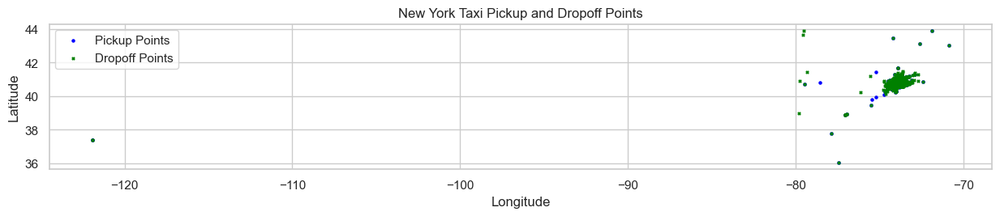

In [15]:

gdf_pickup = gpd.GeoDataFrame(taxi_data, geometry=gpd.points_from_xy(taxi_data.pickup_longitude, taxi_data.pickup_latitude))
gdf_dropoff = gpd.GeoDataFrame(taxi_data, geometry=gpd.points_from_xy(taxi_data.dropoff_longitude, taxi_data.dropoff_latitude))

sns.set(style="whitegrid")

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf_pickup.plot(ax=ax, marker='o', color='blue', markersize=5, label='Pickup Points')

gdf_dropoff.plot(ax=ax, marker='x', color='green', markersize=5, label='Dropoff Points')

ax.set_title('New York Taxi Pickup and Dropoff Points')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend()
plt.show()


Some extreme outliers appear to exist, I will proceed by visualizing NYC's zones and boroughs to see which data might be the most relevant and whether the existing outliers do not concern NYC taxi trips.

I will group further the zones by borough and mark the existing airports on the map

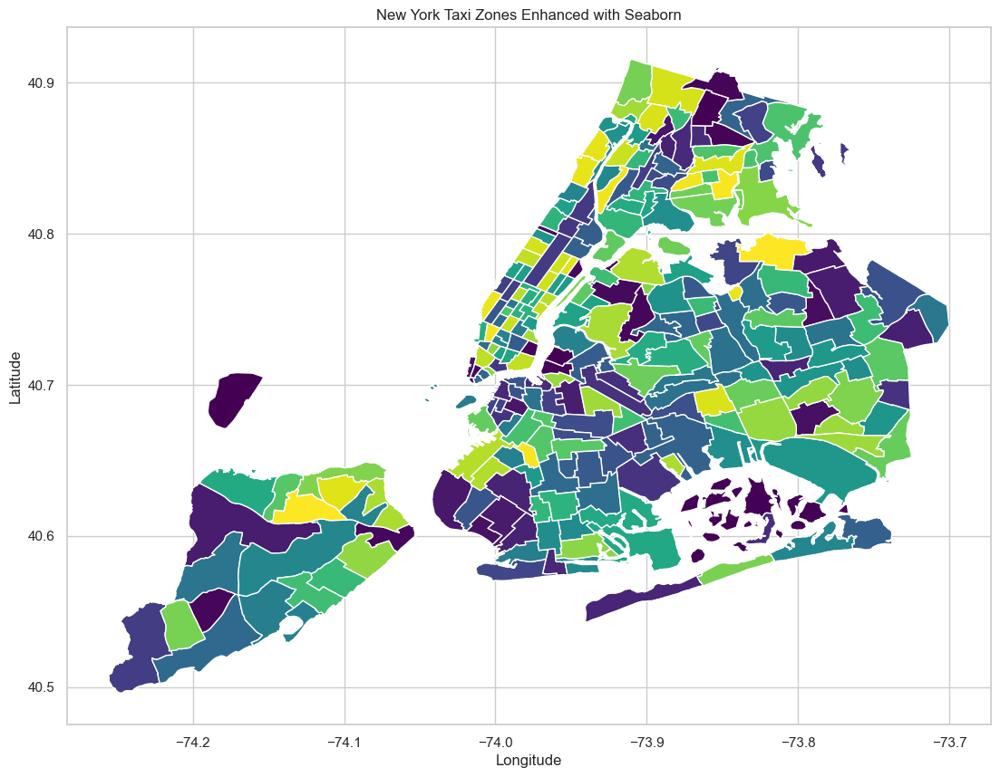

In [22]:

taxi_zones['the_geom'] = taxi_zones['the_geom'].apply(wkt.loads)
taxi_gdf = gpd.GeoDataFrame(taxi_zones, geometry='the_geom')

sns.set(style="whitegrid")

palette = sns.color_palette("viridis", as_cmap=True)

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

taxi_gdf.plot(ax=ax, cmap=palette)

ax.set_title('New York Taxi Zones Enhanced with Seaborn')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


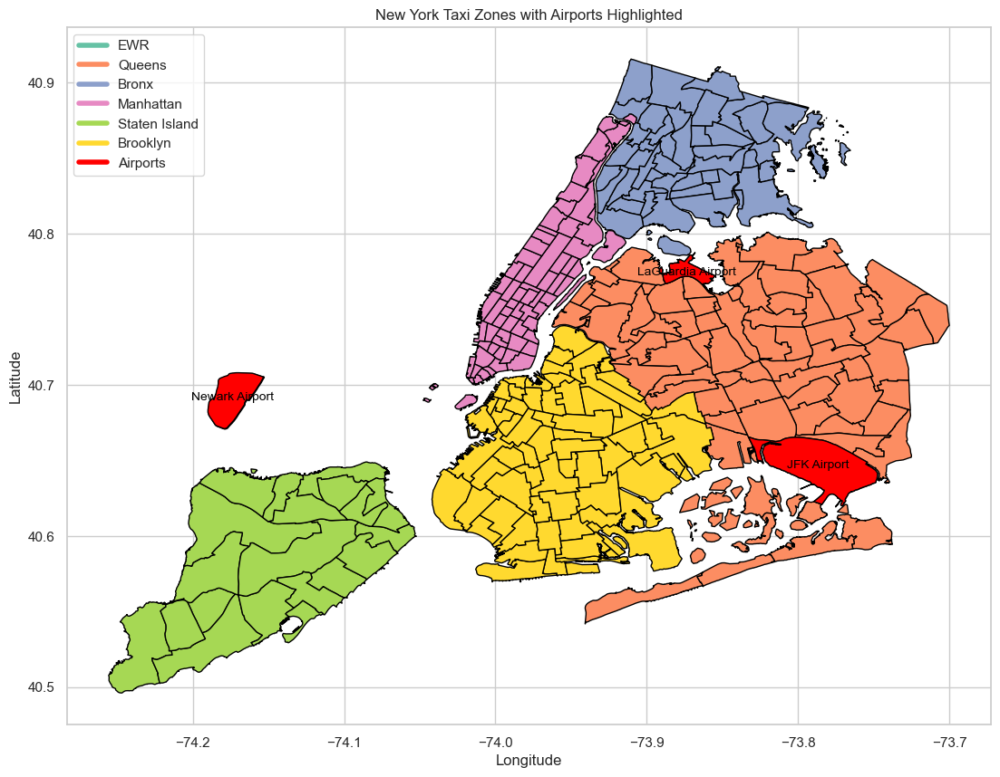

In [25]:
airports = ['Airport' in name for name in taxi_gdf['zone']]

taxi_gdf['color'] = 'blue' 
taxi_gdf.loc[airports, 'color'] = 'red'  

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

boroughs = taxi_gdf['borough'].unique()
palette = sns.color_palette("Set2", len(boroughs))

for borough, color in zip(boroughs, palette):
    taxi_gdf[taxi_gdf['borough'] == borough].plot(ax=ax, color=color, edgecolor='black')

taxi_gdf[taxi_gdf['color'] == 'red'].plot(ax=ax, color='red', edgecolor='black')

for idx, row in airport_gdf.iterrows():
    centroid = row['the_geom'].centroid
    ax.annotate(row['zone'], (centroid.x, centroid.y), color='black', fontsize=10, ha='center', va='center')

ax.set_title('New York Taxi Zones with Airports Highlighted')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

borough_patches = [plt.Line2D([0], [0], color=color, lw=4, label=borough) for borough, color in zip(boroughs, palette)]
airport_patch = plt.Line2D([0], [0], color='red', lw=4, label='Airports')
ax.legend(handles=borough_patches + [airport_patch], loc='upper left')
plt.show()

First of all we can clearly see that the coordinates of the city range from about (-74.25,-73.65) in longitude and (40,41.2) in latitude. Then the city is divided into 5 boroughs which are further divided into smaller districts. Three airports also appear to exist. I will proceed by visualizing the further division of districts and focus on the commercial ones which intuition says that might have an impact on taxi trips.

In [55]:
ny_districts_data = pd.read_csv('nyzd.csv')

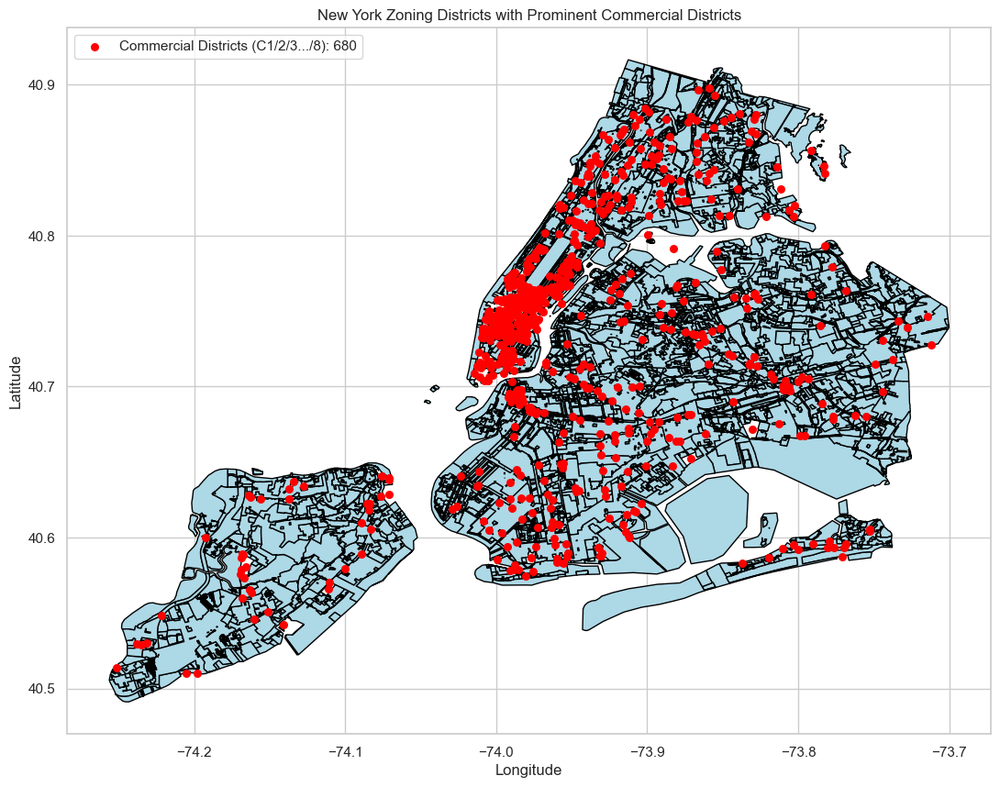

In [5]:
ny_districts_data['the_geom'] = ny_districts_data['the_geom'].apply(wkt.loads)

gdf = gpd.GeoDataFrame(ny_districts_data, geometry='the_geom')


gdf['C1_C2'] = gdf['ZONEDIST'].apply(lambda x: x.startswith('C1') or x.startswith('C2') or x.startswith('C3')
                                               or x.startswith('C4') or x.startswith('C5') or x.startswith('C6')
                                               or x.startswith('C7') or x.startswith('C8')) 

sns.set(style="whitegrid")
num_commercial_districts = gdf[gdf['C1_C2']].shape[0]

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf[gdf['C1_C2'] == False].plot(ax=ax, color='lightblue', edgecolor='black')
gdf[gdf['C1_C2']].centroid.plot(ax=ax, marker='o', color='red', markersize=30)


ax.set_title('New York Zoning Districts with Prominent Commercial Districts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

legend_label = f"Commercial Districts (C1/2/3.../8): {num_commercial_districts}"
ax.legend([legend_label], loc='upper left')
plt.show()

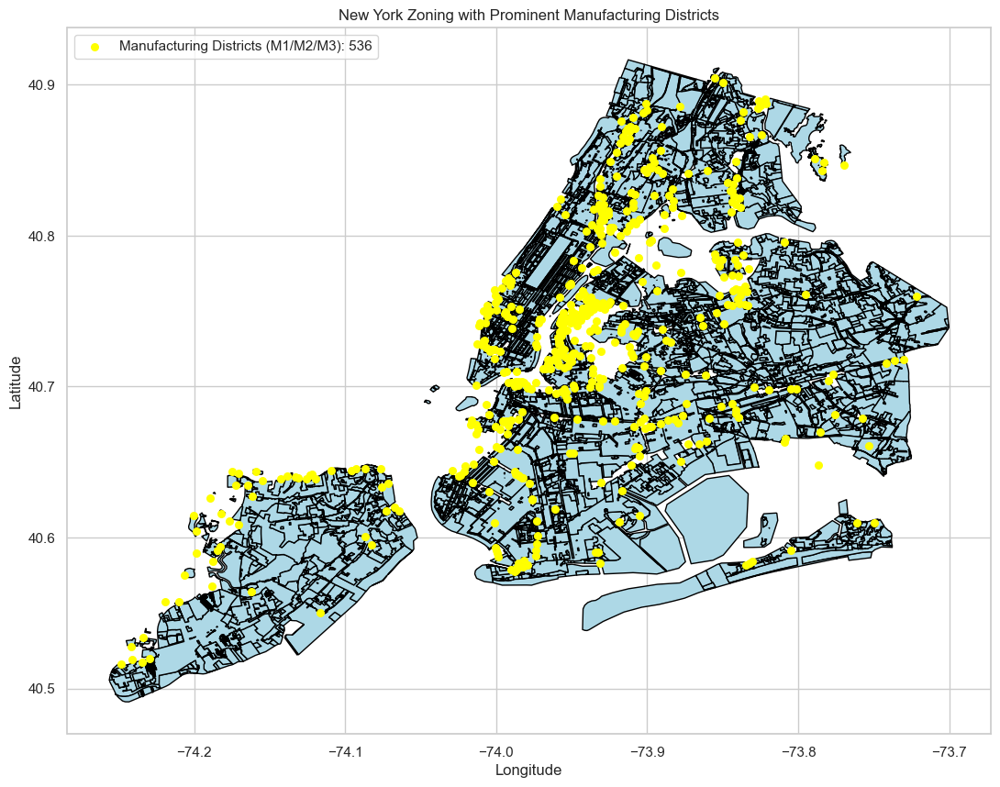

In [10]:
ny_districts_data['the_geom'] = ny_districts_data['the_geom'].apply(wkt.loads)

gdf = gpd.GeoDataFrame(ny_districts_data, geometry='the_geom')


gdf['C1_C2'] = gdf['ZONEDIST'].apply(lambda x: x.startswith('M1') or x.startswith('M2') or x.startswith('M3')) 

sns.set(style="whitegrid")
num_commercial_districts = gdf[gdf['C1_C2']].shape[0]

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf[gdf['C1_C2'] == False].plot(ax=ax, color='lightblue', edgecolor='black')

gdf[gdf['C1_C2']].centroid.plot(ax=ax, marker='o', color='yellow', markersize=30)

ax.set_title('New York Zoning with Prominent Manufacturing Districts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

legend_label = f"Manufacturing Districts (M1/M2/M3): {num_commercial_districts}"
ax.legend([legend_label], loc='upper left')

plt.show()

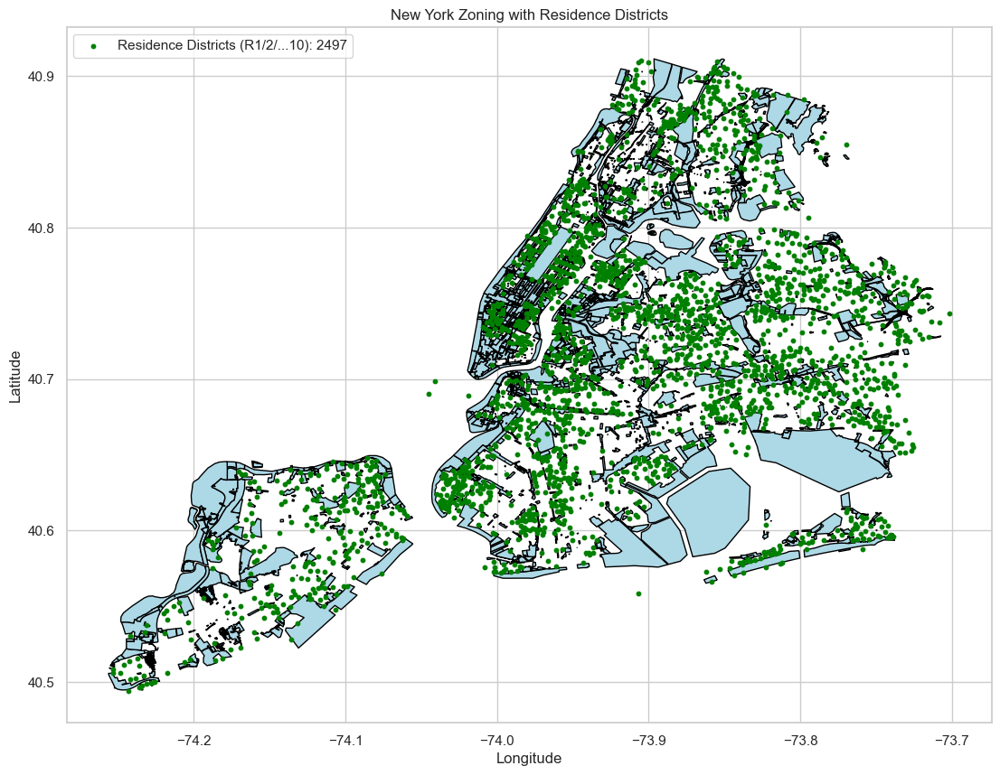

In [56]:
ny_districts_data['the_geom'] = ny_districts_data['the_geom'].apply(wkt.loads)

gdf = gpd.GeoDataFrame(ny_districts_data, geometry='the_geom')


gdf['C1_C2'] = gdf['ZONEDIST'].apply(lambda x: x.startswith('R1') or x.startswith('R2') or x.startswith('R3')
                                               or x.startswith('R4') or x.startswith('R5') or x.startswith('R6')
                                               or x.startswith('R7') or x.startswith('R8') or x.startswith('R9')
                                               or x.startswith('R10'))


sns.set(style="whitegrid")

num_commercial_districts = gdf[gdf['C1_C2']].shape[0]

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf[gdf['C1_C2'] == False].plot(ax=ax, color='lightblue', edgecolor='black')

gdf[gdf['C1_C2']].centroid.plot(ax=ax, marker='o', color='green', markersize=10)

ax.set_title('New York Zoning with Residence Districts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

legend_label = f"Residence Districts (R1/2/...10): {num_commercial_districts}"
ax.legend([legend_label], loc='upper left')

plt.show()

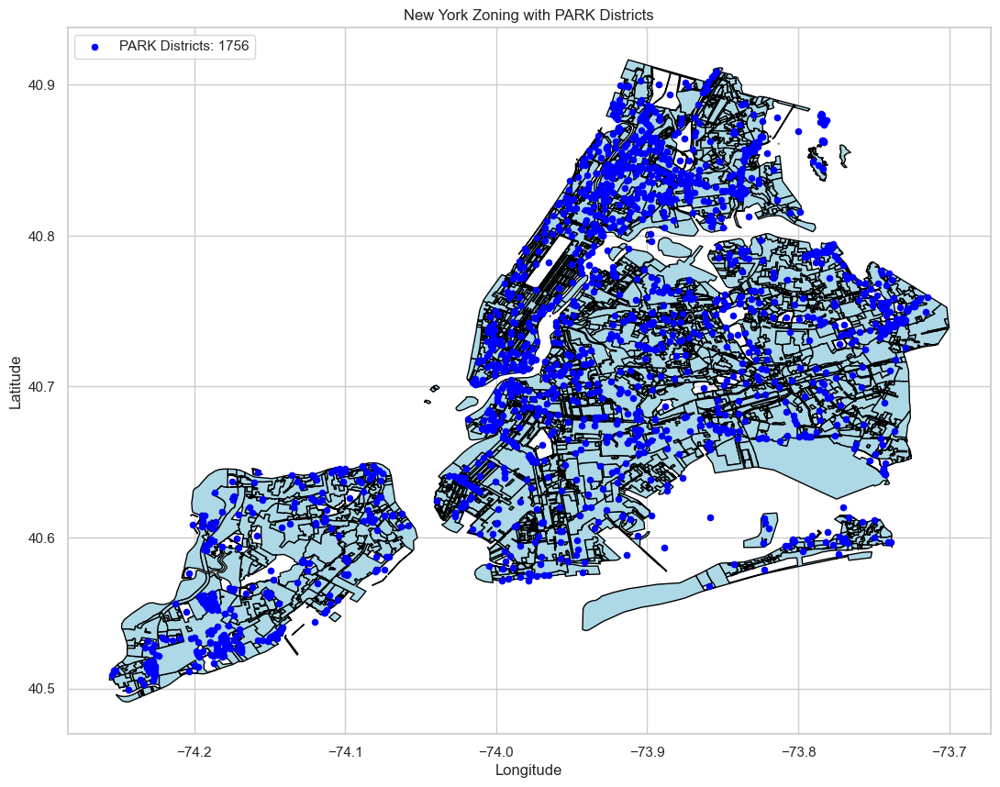

In [18]:
ny_districts_data['the_geom'] = ny_districts_data['the_geom'].apply(wkt.loads)

gdf = gpd.GeoDataFrame(ny_districts_data, geometry='the_geom')


gdf['C1_C2'] = gdf['ZONEDIST'].apply(lambda x: x.startswith('PARK'))

sns.set(style="whitegrid")
num_commercial_districts = gdf[gdf['C1_C2']].shape[0]

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

gdf[gdf['C1_C2'] == False].plot(ax=ax, color='lightblue', edgecolor='black')

gdf[gdf['C1_C2']].centroid.plot(ax=ax, marker='o', color='blue', markersize=20)

ax.set_title('New York Zoning with PARK Districts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

legend_label = f"PARK Districts: {num_commercial_districts}"
ax.legend([legend_label], loc='upper left')

plt.show()

Now that I have a clearer and more informative picture of NYC's grid and its "hot" locations like airports and commercial districts, I will proceed by plotting all the available pickup and dropoff points (that exist within the city's coordinates)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
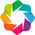

:Overlay
   .Image.I :Image   [pickup_longitude,pickup_latitude]   (z)
   .Tiles.I :Tiles   [x,y]

In [33]:

hv.extension('bokeh')

canvas = ds.Canvas(plot_width=800, plot_height=500, x_range=(-74.25, -73.65), y_range=(40.4, 41))

pickup_agg = canvas.points(gdf_pickup, 'pickup_longitude', 'pickup_latitude')
dropoff_agg = canvas.points(gdf_dropoff, 'dropoff_longitude', 'dropoff_latitude')

pickup_shaded = tf.shade(pickup_agg, cmap=['green'])
dropoff_shaded = tf.shade(dropoff_agg, cmap=['red'])

taxi_map = tf.stack(pickup_shaded, dropoff_shaded)
hv.Image(taxi_map).opts(width=800, height=500) * StamenTerrain()

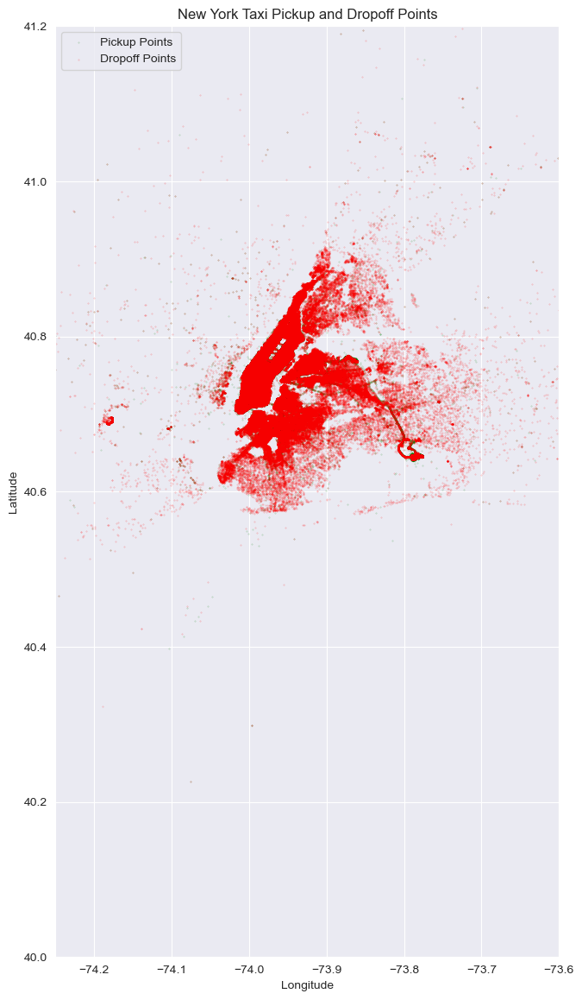

In [51]:

gdf_all_pickup = gpd.GeoDataFrame(taxi_data, geometry=gpd.points_from_xy(taxi_data.pickup_longitude, taxi_data.pickup_latitude))
gdf_all_dropoff = gpd.GeoDataFrame(taxi_data, geometry=gpd.points_from_xy(taxi_data.dropoff_longitude, taxi_data.dropoff_latitude))

lon_range = (-74.25, -73.6)
lat_range = (40.0, 41.2)

fig, ax = plt.subplots(1, 1, figsize=(14, 14))
ax.set_xlim(lon_range)
ax.set_ylim(lat_range)

gdf_all_pickup.plot(ax=ax, marker='o', color='green', markersize=0.1, label='Pickup Points', alpha=0.3)

gdf_all_dropoff.plot(ax=ax, marker='o', color='red', markersize=0.1, label='Dropoff Points', alpha=0.3)

ax.set_title('New York Taxi Pickup and Dropoff Points')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend()

plt.show()

Manhattan and parts of Queens and Brooklyn appear to be the busiest areas. However we can also spot smaller clusters around the airport locations. My goal is now to combine my taxi data with the zones by mapping each pickup and dropoff point to their respective boroughs, zones and districts. I will do that by converting the geom column from WKT format to a geometry object and then the taxi data into a geodataframe. I will do a spatial join and then merge back to the original df. I will also print the number of trips without a borough/zone.

I will now indicate the pick up and dropoff points that are in commercial districts.
Commercial districts are the ones in the ZONEDIST column that are named C1/2/..8. I will filter out these districts and then do spatial matching with the pick up and drop off coordinates in the taxi dta. 1 = is in commercial district. 0 = it's not in commercial district

In [2]:

taxi_zone_df = pd.read_csv('taxi_zones.csv')

In [3]:
taxi_data_df = pd.read_csv('updated_taxi_data_routes_decoded_polylines.csv')

In [5]:
taxi_zone_df.head()

,OBJECTID,Shape_Leng,the_geom,Shape_Area,zone,LocationID,borough
0,1,0.116357,MULTIPOLYGON (((-74.18445299999996 40.69499599...,0.000782,Newark Airport,1,EWR
1,2,0.433470,MULTIPOLYGON (((-73.82337597260663 40.63898704...,0.004866,Jamaica Bay,2,Queens
2,3,0.084341,MULTIPOLYGON (((-73.84792614099985 40.87134223...,0.000314,Allerton/Pelham Gardens,3,Bronx
3,4,0.043567,MULTIPOLYGON (((-73.97177410965318 40.72582128...,0.000112,Alphabet City,4,Manhattan
4,5,0.092146,MULTIPOLYGON (((-74.17421738099989 40.56256808...,0.000498,Arden Heights,5,Staten Island


In [4]:

taxi_zone_df['geometry'] = taxi_zone_df['the_geom'].apply(wkt.loads)
geo_taxi_zone_df = gpd.GeoDataFrame(taxi_zone_df, geometry='geometry')

gdf_taxi_data = gpd.GeoDataFrame(
    taxi_data_df,
    geometry=gpd.points_from_xy(taxi_data_df.pickup_longitude, taxi_data_df.pickup_latitude),
    crs="EPSG:4326"
)
gdf_taxi_dropoff = gpd.GeoDataFrame(
    taxi_data_df,
    geometry=gpd.points_from_xy(taxi_data_df.dropoff_longitude, taxi_data_df.dropoff_latitude),
    crs="EPSG:4326"
)

taxi_data_with_pickup_zones = sjoin(gdf_taxi_data, geo_taxi_zone_df, how='left', op='within')
taxi_data_with_pickup_zones.rename(columns={'zone': 'pickup_zone', 'borough': 'pickup_borough'}, inplace=True)

taxi_data_with_dropoff_zones = sjoin(gdf_taxi_dropoff, geo_taxi_zone_df, how='left', op='within')
taxi_data_with_dropoff_zones.rename(columns={'zone': 'dropoff_zone', 'borough': 'dropoff_borough'}, inplace=True)

taxi_data_final = taxi_data_df.copy()
taxi_data_final['pickup_zone'] = taxi_data_with_pickup_zones['pickup_zone']
taxi_data_final['pickup_borough'] = taxi_data_with_pickup_zones['pickup_borough']
taxi_data_final['dropoff_zone'] = taxi_data_with_dropoff_zones['dropoff_zone']
taxi_data_final['dropoff_borough'] = taxi_data_with_dropoff_zones['dropoff_borough']

no_pickup_zone_count = taxi_data_final['pickup_zone'].isnull().sum()
no_dropoff_zone_count = taxi_data_final['dropoff_zone'].isnull().sum()
both_zones_missing_count = taxi_data_final[(taxi_data_final['pickup_zone'].isnull()) & (taxi_data_final['dropoff_zone'].isnull())].shape[0]

taxi_data_final.head(), (no_pickup_zone_count, no_dropoff_zone_count, both_zones_missing_count)


C:\Users\elkok\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3400: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
C:\Users\elkok\AppData\Local\Temp\ipykernel_19488\2303746285.py:22: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  taxi_data_with_pickup_zones = sjoin(gdf_taxi_data, geo_taxi_zone_df, how='left', op='within')
C:\Users\elkok\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3400: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
C:\Users\elkok\AppData\Local\Temp\ipykernel_19488\2303746285.py:26: UserWarning

(          id  vendor_id      pickup_datetime     dropoff_datetime  \
 0  id2875421          2  2016-03-14 17:24:55  2016-03-14 17:32:30   
 1  id2377394          1  2016-06-12 00:43:35  2016-06-12 00:54:38   
 2  id3858529          2  2016-01-19 11:35:24  2016-01-19 12:10:48   
 3  id3504673          2  2016-04-06 19:32:31  2016-04-06 19:39:40   
 4  id2181028          2  2016-03-26 13:30:55  2016-03-26 13:38:10   
 
    passenger_count  pickup_longitude  pickup_latitude  dropoff_longitude  \
 0                1        -73.982155        40.767937         -73.964630   
 1                1        -73.980415        40.738564         -73.999481   
 2                1        -73.979027        40.763939         -74.005333   
 3                1        -74.010040        40.719971         -74.012268   
 4                1        -73.973053        40.793209         -73.972923   
 
    dropoff_latitude store_and_fwd_flag  ...  average temperature  \
 0         40.765602                  N  ... 

In [26]:

taxi_zone_df['geometry'] = taxi_zone_df['the_geom'].apply(wkt.loads)
geo_taxi_zone_df = gpd.GeoDataFrame(taxi_zone_df, geometry='geometry')

geo_taxi_zone_df.set_crs("EPSG:4326", inplace=True)

gdf_taxi_data = gpd.GeoDataFrame(
    taxi_data_df,
    geometry=gpd.points_from_xy(taxi_data_df.pickup_longitude, taxi_data_df.pickup_latitude),
    crs="EPSG:4326"
)

gdf_taxi_dropoff = gpd.GeoDataFrame(
    taxi_data_df,
    geometry=gpd.points_from_xy(taxi_data_df.dropoff_longitude, taxi_data_df.dropoff_latitude),
    crs="EPSG:4326"
)

taxi_data_with_pickup_zones = sjoin(gdf_taxi_data, geo_taxi_zone_df, how='left', predicate='within')
taxi_data_with_pickup_zones.rename(columns={'zone': 'pickup_zone', 'borough': 'pickup_borough'}, inplace=True)

taxi_data_with_dropoff_zones = sjoin(gdf_taxi_dropoff, geo_taxi_zone_df, how='left', predicate='within')
taxi_data_with_dropoff_zones.rename(columns={'zone': 'dropoff_zone', 'borough': 'dropoff_borough'}, inplace=True)

taxi_data_final = taxi_data_df.copy()
taxi_data_final = taxi_data_final.merge(taxi_data_with_pickup_zones[['pickup_zone', 'pickup_borough']], left_index=True, right_index=True, how='left')
taxi_data_final = taxi_data_final.merge(taxi_data_with_dropoff_zones[['dropoff_zone', 'dropoff_borough']], left_index=True, right_index=True, how='left')

no_pickup_zone_count = taxi_data_final['pickup_zone'].isnull().sum()
no_dropoff_zone_count = taxi_data_final['dropoff_zone'].isnull().sum()
both_zones_missing_count = taxi_data_final[(taxi_data_final['pickup_zone'].isnull()) & (taxi_data_final['dropoff_zone'].isnull())].shape[0]

taxi_data_final.head(), (no_pickup_zone_count, no_dropoff_zone_count, both_zones_missing_count)


(          id  vendor_id      pickup_datetime     dropoff_datetime  \
 0  id2875421          2  2016-03-14 17:24:55  2016-03-14 17:32:30   
 1  id2377394          1  2016-06-12 00:43:35  2016-06-12 00:54:38   
 2  id3858529          2  2016-01-19 11:35:24  2016-01-19 12:10:48   
 3  id3504673          2  2016-04-06 19:32:31  2016-04-06 19:39:40   
 4  id2181028          2  2016-03-26 13:30:55  2016-03-26 13:38:10   
 
    passenger_count  pickup_longitude  pickup_latitude  dropoff_longitude  \
 0                1        -73.982155        40.767937         -73.964630   
 1                1        -73.980415        40.738564         -73.999481   
 2                1        -73.979027        40.763939         -74.005333   
 3                1        -74.010040        40.719971         -74.012268   
 4                1        -73.973053        40.793209         -73.972923   
 
    dropoff_latitude store_and_fwd_flag  ...  average temperature  \
 0         40.765602                  N  ... 

Things to note: I have 1102 trips where their pickup point was not within the city’s zones. 3723 trips where their dropoff point was not within the city’s zones and 846 trips where neither pickup or dropoff point was. I will now indicate the pick up and dropoff points that are in each district (commercial/residential/manufacturing).
I will filter out these districts and then do spatial matching with the pick up and drop off coordinates in the taxi dta. 1 = is in commercial district. 0 = it's not in commercial district

In [27]:
taxi_data_final

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,average temperature,precipitation,snow fall,snow depth,is_holiday,decoded_polyline,pickup_zone,pickup_borough,dropoff_zone,dropoff_borough
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,45.5,0.29,0.0,0,0,"[(40.76781, -73.98228), (40.76776, -73.9822), ...",Lincoln Square East,Manhattan,Upper East Side South,Manhattan
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,72.5,0.00,0.0,0,1,"[(40.73856, -73.98045), (40.73253, -73.9848), ...",Kips Bay,Manhattan,Greenwich Village South,Manhattan
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,22.0,0.00,0.0,0,0,"[(40.76415, -73.97887), (40.76304, -73.97622),...",Midtown North,Manhattan,Seaport,Manhattan
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,39.0,0.00,0.0,0,0,"[(40.71998, -74.01015), (40.71811, -74.01048),...",TriBeCa/Civic Center,Manhattan,Financial District South,Manhattan
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,46.5,0.00,0.0,0,1,"[(40.79319, -73.97301), (40.79036, -73.97506),...",Upper West Side North,Manhattan,Upper West Side South,Manhattan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458497,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,...,45.0,0.01,0.0,0,0,"[(40.74559, -73.98236), (40.74578, -73.98222),...",Murray Hill,Manhattan,Flatiron,Manhattan
1458498,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,...,49.5,1.80,0.0,0,1,"[(40.74731, -74.00079), (40.74691, -74.00107),...",East Chelsea,Manhattan,Manhattan Valley,Manhattan
1458499,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,...,70.5,0.00,0.0,0,0,"[(40.76905, -73.95896), (40.7682, -73.95692), ...",Lenox Hill West,Manhattan,Financial District North,Manhattan
1458500,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,...,20.0,0.00,0.0,0,0,"[(40.74905, -73.98204), (40.74967, -73.98159),...",Murray Hill,Manhattan,Midtown Center,Manhattan


In [8]:
taxi_data_final.to_csv("updated_taxi_data_zones_boroughs_csv", index = False)

In [28]:
taxi_data_df = pd.read_csv('updated_taxi_data_zones_boroughs_csv')

In [29]:
nyzd_df = pd.read_csv('nyzd.csv')

In [16]:
nyzd_df

,the_geom,ZONEDIST,Shape_Leng,Shape_Area
0,MULTIPOLYGON (((-74.08706820023316 40.64779055...,R5,1862.207446,1.943711e+05
1,MULTIPOLYGON (((-74.08717033953643 40.64470301...,R5,19208.305164,2.767667e+06
2,MULTIPOLYGON (((-74.08143374169059 40.64602344...,R6,2935.376415,5.333286e+05
3,MULTIPOLYGON (((-74.08143374169059 40.64602344...,R4,3246.982638,5.797014e+05
4,MULTIPOLYGON (((-74.08683367914871 40.64491231...,M1-1,1797.546542,1.966755e+05
...,...,...,...,...
5465,MULTIPOLYGON (((-73.9256018137432 40.858347721...,R7-2,62.210656,7.482730e+00
5466,MULTIPOLYGON (((-73.92549229592143 40.85832726...,R7-2,62.408852,7.505519e+00
5467,MULTIPOLYGON (((-73.9257971814553 40.859405348...,R7-2,91.228660,7.676868e+00
5468,MULTIPOLYGON (((-73.92480822065994 40.85788426...,R7-2,66.865384,8.330051e+00


In [30]:

commercial_districts = nyzd_df[nyzd_df['ZONEDIST'].str.startswith(('C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8'))]

commercial_districts['geometry'] = commercial_districts['the_geom'].apply(wkt.loads)
geo_commercial_districts = gpd.GeoDataFrame(commercial_districts, geometry='geometry')
geo_commercial_districts.set_crs("EPSG:4326", inplace=True)

pickup_in_commercial = sjoin(gdf_taxi_data, geo_commercial_districts, how='left', predicate='within')
taxi_data_df['pickup_commercial_district'] = pickup_in_commercial['ZONEDIST'].notnull().astype(int)

dropoff_in_commercial = sjoin(gdf_taxi_dropoff, geo_commercial_districts, how='left', predicate='within')
taxi_data_df['dropoff_commercial_district'] = dropoff_in_commercial['ZONEDIST'].notnull().astype(int)

C:\Users\elkok\AppData\Local\Temp\ipykernel_19488\3912770705.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  commercial_districts['geometry'] = commercial_districts['the_geom'].apply(wkt.loads)


In [30]:
taxi_data_df['pickup_commercial_district'].sum(), taxi_data_df['dropoff_commercial_district'].sum()

(218542, 171506)

In [31]:
taxi_data_df['pickup_commercial_district'].sum(), taxi_data_df['dropoff_commercial_district'].sum()

(903775, 783043)

Now I will do the same for the residential, manufacturing, PARK and airport districts. I will also create a 50m buffer threshold to include points that fall slightly outside of the airport district.

In [32]:

residential_districts = nyzd_df[nyzd_df['ZONEDIST'].str.startswith(('R1', 'R2', 'R3','R4', 'R5', 'R6', 'R7', 'R8', 'R9', 'R10'))]

residential_districts['geometry'] = residential_districts['the_geom'].apply(wkt.loads)
geo_residential_districts = gpd.GeoDataFrame(residential_districts, geometry='geometry')
geo_residential_districts.set_crs("EPSG:4326", inplace=True)

pickup_in_residential = sjoin(gdf_taxi_data, geo_residential_districts, how='left', predicate='within')
pickup_in_residential.reset_index(drop=True, inplace=True) 
taxi_data_df['pickup_residential_district'] = pickup_in_residential['ZONEDIST'].notnull().astype(int)

dropoff_in_residential = sjoin(gdf_taxi_dropoff, geo_residential_districts, how='left', predicate='within')
dropoff_in_residential.reset_index(drop=True, inplace=True)
taxi_data_df['dropoff_residential_district'] = dropoff_in_residential['ZONEDIST'].notnull().astype(int)


C:\Users\elkok\AppData\Local\Temp\ipykernel_19488\2075094396.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  residential_districts['geometry'] = residential_districts['the_geom'].apply(wkt.loads)


In [11]:
taxi_data_df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,day_of_week,date,average temperature,precipitation,snow fall,snow depth,is_holiday,decoded_polyline,pickup_residential_district,dropoff_residential_district
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,Monday,2016-03-14,45.5,0.29,0.0,0,0,"[(40.76781, -73.98228), (40.76776, -73.9822), ...",0,1
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,Sunday,2016-06-12,72.5,0.00,0.0,0,1,"[(40.73856, -73.98045), (40.73253, -73.9848), ...",0,1
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,Tuesday,2016-01-19,22.0,0.00,0.0,0,0,"[(40.76415, -73.97887), (40.76304, -73.97622),...",0,0
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,Wednesday,2016-04-06,39.0,0.00,0.0,0,0,"[(40.71998, -74.01015), (40.71811, -74.01048),...",0,0
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,Saturday,2016-03-26,46.5,0.00,0.0,0,1,"[(40.79319, -73.97301), (40.79036, -73.97506),...",0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458497,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,...,Friday,2016-04-08,45.0,0.01,0.0,0,0,"[(40.74559, -73.98236), (40.74578, -73.98222),...",0,0
1458498,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,...,Sunday,2016-01-10,49.5,1.80,0.0,0,1,"[(40.74731, -74.00079), (40.74691, -74.00107),...",1,0
1458499,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,...,Friday,2016-04-22,70.5,0.00,0.0,0,0,"[(40.76905, -73.95896), (40.7682, -73.95692), ...",1,1
1458500,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,...,Tuesday,2016-01-05,20.0,0.00,0.0,0,0,"[(40.74905, -73.98204), (40.74967, -73.98159),...",0,0


In [33]:
taxi_data_df['pickup_residential_district'].sum(), taxi_data_df['dropoff_residential_district'].sum()

(365137, 507843)

In [34]:

commercial_districts = nyzd_df[nyzd_df['ZONEDIST'].str.startswith(('M1', 'M2', 'M3'))]

commercial_districts['geometry'] = commercial_districts['the_geom'].apply(wkt.loads)
geo_commercial_districts = gpd.GeoDataFrame(commercial_districts, geometry='geometry')
geo_commercial_districts.set_crs("EPSG:4326", inplace=True)

pickup_in_commercial = sjoin(gdf_taxi_data, geo_commercial_districts, how='left', predicate='within')
taxi_data_df['pickup_manufacturing_district'] = pickup_in_commercial['ZONEDIST'].notnull().astype(int)

dropoff_in_commercial = sjoin(gdf_taxi_dropoff, geo_commercial_districts, how='left', predicate='within')
taxi_data_df['dropoff_manufacturing_district'] = dropoff_in_commercial['ZONEDIST'].notnull().astype(int)

C:\Users\elkok\AppData\Local\Temp\ipykernel_19488\1344515644.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  commercial_districts['geometry'] = commercial_districts['the_geom'].apply(wkt.loads)


In [35]:
taxi_data_df['pickup_manufacturing_district'].sum(), taxi_data_df['dropoff_manufacturing_district'].sum()

(170302, 143647)

In [256]:

PARK_districts = nyzd_df[nyzd_df['ZONEDIST'].str.startswith(('PARK'))]

PARK_districts['geometry'] = PARK_districts['the_geom'].apply(wkt.loads)
geo_PARK_districts = gpd.GeoDataFrame(PARK_districts, geometry='geometry')
geo_PARK_districts.set_crs("EPSG:4326", inplace=True)

pickup_in_PARK = sjoin(gdf_taxi_data, geo_PARK_districts, how='left', predicate='within')
taxi_data['pickup_PARK_district'] = pickup_in_PARK['ZONEDIST'].notnull().astype(int)

dropoff_in_PARK = sjoin(gdf_taxi_dropoff, geo_PARK_districts, how='left', predicate='within')
taxi_data['dropoff_PARK_district'] = dropoff_in_PARK['ZONEDIST'].notnull().astype(int)

C:\Users\elkok\AppData\Local\Temp\ipykernel_19488\2431340329.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PARK_districts['geometry'] = PARK_districts['the_geom'].apply(wkt.loads)


In [254]:
taxi_data_df['pickup_PARK_district'].sum(), taxi_data_df['dropoff_PARK_district'].sum()

(7685, 8530)

In [19]:
taxi_data_df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,snow fall,snow depth,is_holiday,decoded_polyline,pickup_residential_district,dropoff_residential_district,pickup_commercial_district,dropoff_commercial_district,pickup_manufacturing_district,dropoff_manufacturing_district
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,0.0,0,0,"[(40.76781, -73.98228), (40.76776, -73.9822), ...",0,1,1,0,0,0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,0.0,0,1,"[(40.73856, -73.98045), (40.73253, -73.9848), ...",0,1,1,0,0,0
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,0.0,0,0,"[(40.76415, -73.97887), (40.76304, -73.97622),...",0,0,1,1,0,0
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,0.0,0,0,"[(40.71998, -74.01015), (40.71811, -74.01048),...",0,0,1,1,0,0
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,0.0,0,1,"[(40.79319, -73.97301), (40.79036, -73.97506),...",0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458497,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,...,0.0,0,0,"[(40.74559, -73.98236), (40.74578, -73.98222),...",0,0,1,1,0,0
1458498,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,...,0.0,0,1,"[(40.74731, -74.00079), (40.74691, -74.00107),...",1,0,0,0,0,0
1458499,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,...,0.0,0,0,"[(40.76905, -73.95896), (40.7682, -73.95692), ...",1,1,0,1,0,0
1458500,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,...,0.0,0,0,"[(40.74905, -73.98204), (40.74967, -73.98159),...",0,0,1,1,0,0


In [36]:
taxi_data_df.isna().sum()

id                                   0
vendor_id                            0
pickup_datetime                      0
dropoff_datetime                     0
passenger_count                      0
pickup_longitude                     0
pickup_latitude                      0
dropoff_longitude                    0
dropoff_latitude                     0
store_and_fwd_flag                   0
trip_duration                        0
month                                0
day                                  0
hour                                 0
minute                               0
calculated_distance                  0
calculated_duration                  0
day_of_week                          0
date                                 0
average temperature                  0
precipitation                        0
snow fall                            0
snow depth                           0
is_holiday                           0
decoded_polyline                  4142
pickup_zone              

In [22]:
taxi_zones_df = pd.read_csv('taxi_zones.csv')

In [37]:

taxi_zones_df['geometry'] = taxi_zones_df['the_geom'].apply(wkt.loads)
geo_taxi_zones_df = gpd.GeoDataFrame(taxi_zones_df, geometry='geometry')
geo_taxi_zones_df.set_crs("EPSG:4326", inplace=True)

airport_zones = geo_taxi_zones_df[geo_taxi_zones_df['zone'].str.contains("Airport", case=False, na=False)]

airport_zones_buffered = airport_zones.to_crs("EPSG:2263")

airport_zones_buffered['geometry'] = airport_zones_buffered['geometry'].buffer(50)

airport_zones_buffered = airport_zones_buffered.to_crs("EPSG:4326")

pickup_in_airport = sjoin(gdf_taxi_data, airport_zones_buffered, how='left', predicate='intersects')
taxi_data_df['pickup_airport'] = pickup_in_airport['zone'].notnull().astype(int)

dropoff_in_airport = sjoin(gdf_taxi_dropoff, airport_zones_buffered, how='left', predicate='intersects')
taxi_data_df['dropoff_airport'] = dropoff_in_airport['zone'].notnull().astype(int)

taxi_data_df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,dropoff_zone,dropoff_borough,pickup_commercial_district,dropoff_commercial_district,pickup_residential_district,dropoff_residential_district,pickup_manufacturing_district,dropoff_manufacturing_district,pickup_airport,dropoff_airport
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,Upper East Side South,Manhattan,1,0,0,1,0,0,0,0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,Greenwich Village South,Manhattan,1,0,0,1,0,0,0,0
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,Seaport,Manhattan,1,1,0,0,0,0,0,0
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,Financial District South,Manhattan,1,1,0,0,0,0,0,0
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,Upper West Side South,Manhattan,1,0,0,1,0,0,0,0


In [38]:
taxi_data_df['pickup_airport'].sum(), taxi_data_df['dropoff_airport'].sum()

(68954, 32953)